In [1]:
%cd ../..

D:\Playground\AdvancedTimeSeriesForecastingBook\Github\Modern-Time-Series-Forecasting-with-Python-


In [2]:
import numpy as np
import pandas as pd
import time
import plotly.express as px
import plotly.graph_objects as go
import os
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path
from tqdm.autonotebook import tqdm
import warnings
import humanize

from darts.metrics import mase, mse, mae
from sklearn.preprocessing import StandardScaler

from src.utils.ts_utils import forecast_bias, darts_metrics_adapter
from src.utils.general import LogTime
from src.utils import plotting_utils
%load_ext autoreload
%autoreload 2
np.random.seed(42)
tqdm.pandas()

C:\Users\MANUJO~1\AppData\Local\Temp/ipykernel_22380/186276305.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
os.makedirs("imgs/chapter_4", exist_ok=True)
preprocessed = Path("data/london_smart_meters/preprocessed")

In [4]:
def format_plot(fig, legends = None, xlabel="Time", ylabel="Value", title=""):
    if legends:
        names = cycle(legends)
        fig.for_each_trace(lambda t:  t.update(name = next(names)))
    fig.update_layout(
            autosize=False,
            width=900,
            height=500,
            title_text=title,
            title={
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
            titlefont={
                "size": 20
            },
            legend_title = None,
            yaxis=dict(
                title_text=ylabel,
                titlefont=dict(size=12),
            ),
            xaxis=dict(
                title_text=xlabel,
                titlefont=dict(size=12),
            )
        )
    return fig

In [5]:
#Readin the missing value imputed and train test split data
train_df = pd.read_parquet(preprocessed/"block_0-7_train_missing_imputed_feature_engg.parquet")
test_df = pd.read_parquet(preprocessed/"block_0-7_test_missing_imputed_feature_engg.parquet")

In [6]:
len(train_df.LCLid.unique())

399

# Feature Definition

In [7]:
date_col = "timestamp"
target_col = "energy_consumption"
index_cols = [date_col]
categorical_features= [
    'holidays',
    'precipType',
    'icon',
    'summary',
    'timestamp_Month',
    'timestamp_Quarter',
    'timestamp_WeekDay',
    'timestamp_Dayofweek',
    'timestamp_Dayofyear',
    'timestamp_Hour',
    'timestamp_Minute',

]
boolean_features = [
    'timestamp_Is_quarter_end',
    'timestamp_Is_quarter_start',
    'timestamp_Is_year_end',
    'timestamp_Is_year_start',
    'timestamp_Is_month_start',
]
continous_features = [
 'visibility',
 'windBearing',
 'temperature',
 'dewPoint',
 'pressure',
 'apparentTemperature',
 'windSpeed',
 'humidity',
 'energy_consumption_lag_1',
 'energy_consumption_lag_2',
 'energy_consumption_lag_3',
 'energy_consumption_lag_4',
 'energy_consumption_lag_5',
 'energy_consumption_lag_49',
 'energy_consumption_lag_50',
 'energy_consumption_lag_51',
 'energy_consumption_lag_52',
 'energy_consumption_lag_53',
 'energy_consumption_rolling_3_mean',
 'energy_consumption_rolling_3_std',
 'energy_consumption_rolling_6_mean',
 'energy_consumption_rolling_6_std',
 'energy_consumption_rolling_12_mean',
 'energy_consumption_rolling_12_std',
 'energy_consumption_rolling_48_mean',
 'energy_consumption_rolling_48_std',
 'energy_consumption_48_seasonal_rolling_3_mean',
 'energy_consumption_48_seasonal_rolling_3_std',
 'energy_consumption_336_seasonal_rolling_3_mean',
 'energy_consumption_336_seasonal_rolling_3_std',
 'energy_consumption_ewma__span_2880',
 'energy_consumption_ewma__span_336',
 'energy_consumption_ewma__span_48',
 'timestamp_Elapsed',
 'timestamp_Month_sin_1',
 'timestamp_Month_sin_2',
 'timestamp_Month_sin_3',
 'timestamp_Month_sin_4',
 'timestamp_Month_sin_5',
 'timestamp_Month_cos_1',
 'timestamp_Month_cos_2',
 'timestamp_Month_cos_3',
 'timestamp_Month_cos_4',
 'timestamp_Month_cos_5',
 'timestamp_Hour_sin_1',
 'timestamp_Hour_sin_2',
 'timestamp_Hour_sin_3',
 'timestamp_Hour_sin_4',
 'timestamp_Hour_sin_5',
 'timestamp_Hour_cos_1',
 'timestamp_Hour_cos_2',
 'timestamp_Hour_cos_3',
 'timestamp_Hour_cos_4',
 'timestamp_Hour_cos_5',
 'timestamp_Minute_sin_1',
 'timestamp_Minute_sin_2',
 'timestamp_Minute_sin_3',
 'timestamp_Minute_sin_4',
 'timestamp_Minute_sin_5',
 'timestamp_Minute_cos_1',
 'timestamp_Minute_cos_2',
 'timestamp_Minute_cos_3',
 'timestamp_Minute_cos_4',
 'timestamp_Minute_cos_5']

exogenous_variables = [
    'holidays',
    'precipType',
    'icon',
    'summary',
    'visibility',
    'windBearing',
    'temperature',
    'dewPoint',
    'pressure',
    'apparentTemperature',
    'windSpeed',
    'humidity',
]

feature_list = categorical_features+continous_features+boolean_features

assert target_col not in feature_list
assert date_col not in feature_list
assert len(set(exogenous_variables)-set(feature_list)) == 0
assert np.all([col in feature_list+[target_col, date_col] for col in index_cols])
dropped_columns = set(train_df.columns) - set(feature_list+[target_col, date_col])
print(f"Columns not being used: {dropped_columns}")

Columns not being used: {'stdorToU', 'file', 'series_length', 'frequency', 'Acorn_grouped', 'LCLid', 'Acorn'}


# Feature and Target Preparation

In [8]:
#picking a single time series from the dataset for illustration
freq = train_df.iloc[0]['frequency']
train_features = train_df.loc[train_df.LCLid=="MAC000193", list(set(continous_features)-set(exogenous_variables))+index_cols].set_index(index_cols)
train_features_exo = train_df.loc[train_df.LCLid=="MAC000193", continous_features+index_cols].set_index(index_cols)
train_features_w_cat = train_df.loc[train_df.LCLid=="MAC000193", list(set(continous_features+categorical_features)-set(exogenous_variables))+index_cols].set_index(index_cols)
train_features_w_cat_exo = train_df.loc[train_df.LCLid=="MAC000193", continous_features+categorical_features+index_cols].set_index(index_cols)
train_target = train_df.loc[train_df.LCLid=="MAC000193", [target_col]+index_cols].set_index(index_cols)

test_features = test_df.loc[test_df.LCLid=="MAC000193", list(set(continous_features)-set(exogenous_variables))+index_cols].set_index(index_cols)
test_features_exo = test_df.loc[test_df.LCLid=="MAC000193", continous_features+index_cols].set_index(index_cols)
test_features_w_cat = test_df.loc[test_df.LCLid=="MAC000193", list(set(continous_features+categorical_features)-set(exogenous_variables))+index_cols].set_index(index_cols)
test_features_w_cat_exo = test_df.loc[test_df.LCLid=="MAC000193", continous_features+categorical_features+index_cols].set_index(index_cols)
test_target = test_df.loc[test_df.LCLid=="MAC000193", [target_col]+index_cols].set_index(index_cols)

## Null check

In [9]:
nc = train_features_w_cat_exo.isnull().sum()
nc[nc>0]

pressure                                            22
energy_consumption_lag_1                             1
energy_consumption_lag_2                             2
energy_consumption_lag_3                             3
energy_consumption_lag_4                             4
energy_consumption_lag_5                             5
energy_consumption_lag_49                           49
energy_consumption_lag_50                           50
energy_consumption_lag_51                           51
energy_consumption_lag_52                           52
energy_consumption_lag_53                           53
energy_consumption_rolling_3_mean                    3
energy_consumption_rolling_3_std                     3
energy_consumption_rolling_6_mean                    6
energy_consumption_rolling_6_std                     6
energy_consumption_rolling_12_mean                  12
energy_consumption_rolling_12_std                   12
energy_consumption_rolling_48_mean                  48
energy_con

In [10]:
nc = test_features_w_cat_exo.isnull().sum()
nc[nc>0]

energy_consumption_48_seasonal_rolling_3_std    2
dtype: int64

## Missing Value Handling

In [11]:
bfill_cols=['energy_consumption_lag_1',
 'energy_consumption_lag_2',
 'energy_consumption_lag_3',
 'energy_consumption_lag_4',
 'energy_consumption_lag_5',
 'energy_consumption_lag_49',
 'energy_consumption_lag_50',
 'energy_consumption_lag_51',
 'energy_consumption_lag_52',
 'energy_consumption_lag_53',
 'energy_consumption_rolling_3_mean',
 'energy_consumption_rolling_3_std',
 'energy_consumption_rolling_6_mean',
 'energy_consumption_rolling_6_std',
 'energy_consumption_rolling_12_mean',
 'energy_consumption_rolling_12_std',
 'energy_consumption_rolling_48_mean',
 'energy_consumption_rolling_48_std',
 'energy_consumption_48_seasonal_rolling_3_mean',
 'energy_consumption_48_seasonal_rolling_3_std',
 'energy_consumption_336_seasonal_rolling_3_mean',
 'energy_consumption_336_seasonal_rolling_3_std',
 'energy_consumption_ewma__span_2880',
 'energy_consumption_ewma__span_336',
 'energy_consumption_ewma__span_48']
zero_fill_cols = []
mean_fill_cols = ["pressure"]

def impute_missing_values(df):
    df = df.copy()
    df[bfill_cols] = df[bfill_cols].fillna(method="bfill")
    df[zero_fill_cols] = df[zero_fill_cols].fillna(0)
    # Filling with mean as default fillna strategy
    return df.fillna(df.mean())

# Machine Learning Models

In [18]:
def intersect_list(list1, list2):
    return list(set(list1).intersection(set(list2)))

def subtract_list(list1, list2):
    return list(set(list1)- set(list2))

def union_list(list1, list2):
    return list(set(list1).union(set(list2)))

In [19]:
pred_df = pd.concat([train_target, test_target])
metric_record = []

In [22]:
def eval_model(model, train_features, train_target, test_features, test_target, name=None, fit_kwargs={}, normalize=True, fill_missing=True):
    if name is None:
        name = type(model).__name__
    if fill_missing:
        train_features = impute_missing_values(train_features)
        test_features = impute_missing_values(test_features)
    else:
        train_features = train_features.copy()
        test_features = test_features.copy()
    if normalize:
        scaler=StandardScaler()
        cont_cols =intersect_list(continous_features, train_features.columns)
        train_features[cont_cols] = scaler.fit_transform(train_features[cont_cols])
        test_features[cont_cols] = scaler.transform(test_features[cont_cols])
    model.fit(train_features, train_target, **fit_kwargs)
    if hasattr(model, "coef_") or hasattr(model, "feature_importances_"):
        feat_df = pd.DataFrame({"feature":train_features.columns,"importance":model.coef_.ravel() if hasattr(model, "coef_") else model.feature_importances_.ravel()})
        feat_df["_abs_imp"] = np.abs(feat_df.importance)
        feat_df = feat_df.sort_values("_abs_imp", ascending=False).drop(columns="_abs_imp")
    else:
        feat_df = pd.DataFrame()
    y_pred = model.predict(test_features)
    y_pred = pd.Series(y_pred.ravel(), index=test_target.index, name=name)
    return y_pred, {
        "Algorithm": name,
        "MAE": darts_metrics_adapter(mae, actual_series = test_target, pred_series = y_pred),
        "MSE": darts_metrics_adapter(mse, actual_series = test_target, pred_series = y_pred),
        "MASE": darts_metrics_adapter(mase, actual_series = test_target, pred_series = y_pred, insample=train_target),
        "Forecast Bias": darts_metrics_adapter(forecast_bias, actual_series = test_target, pred_series = y_pred)
    }, feat_df

In [14]:
from itertools import cycle
def plot_forecast(pred_df, forecast_columns, forecast_display_names=None):
    if forecast_display_names is None:
        forecast_display_names = forecast_columns
    else:
        assert len(forecast_columns)==len(forecast_display_names)
    mask = ~pred_df[forecast_columns[0]].isnull()
    colors = ["rgba("+",".join([str(c) for c in plotting_utils.hex_to_rgb(c)])+",<alpha>)" for c in px.colors.qualitative.Plotly]
    act_color = colors[0]
    colors = cycle(colors[1:])
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=pred_df[mask].index, y=pred_df[mask].energy_consumption,
                        mode='lines', line = dict(color=act_color.replace("<alpha>", "0.9")),
                        name='Actual Consumption'))
    for col, display_col in zip(forecast_columns,forecast_display_names):
        fig.add_trace(go.Scatter(x=pred_df[mask].index, y=pred_df.loc[mask, col],
                            mode='lines', line = dict(dash='dot', color=next(colors).replace("<alpha>", "1")),
                            name=display_col))
    return fig

## Linear Models

In [15]:
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV

### Linear Regression

In [23]:
name = "Linear Regression"
model = LinearRegression()
with LogTime() as timer:
    y_pred, metrics, feat_df = eval_model(model, train_features, train_target, test_features, test_target, name=name, normalize=True, fill_missing=True)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


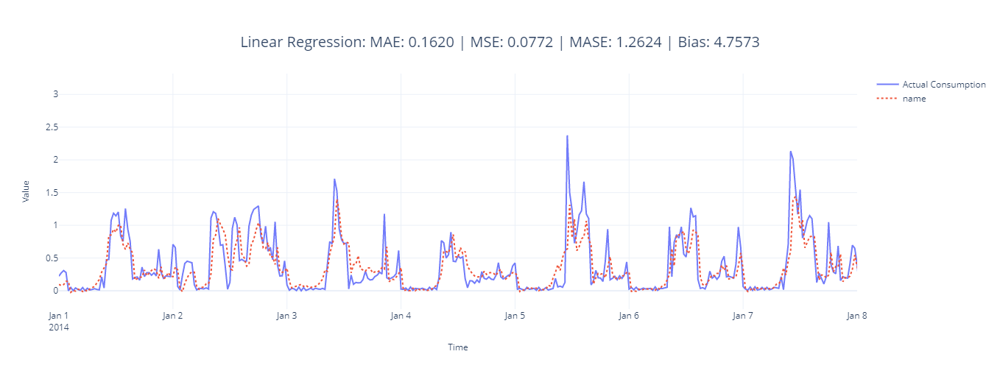

In [24]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=['name'])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [25]:
feat_df.head(10)

,feature,importance
1,timestamp_Minute_sin_3,-3.597885e+10
4,timestamp_Minute_sin_5,1.031545e+10
18,timestamp_Minute_cos_1,-5.493369e+09
49,timestamp_Minute_cos_3,-5.144204e+09
53,timestamp_Minute_sin_1,5.144204e+09
25,timestamp_Minute_cos_5,-5.115718e+09
30,timestamp_Minute_sin_2,-3.839477e+09
14,timestamp_Minute_cos_4,1.421534e+09
13,timestamp_Minute_sin_4,-9.264245e+08
32,timestamp_Minute_cos_2,-1.117094e+07


### Ridge Regression (L1)

In [26]:
name = "Ridge Regression"
model = RidgeCV()
with LogTime() as timer:
    y_pred, metrics, feat_df = eval_model(model, train_features, train_target, test_features, test_target, name=name, normalize=True, fill_missing=True)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


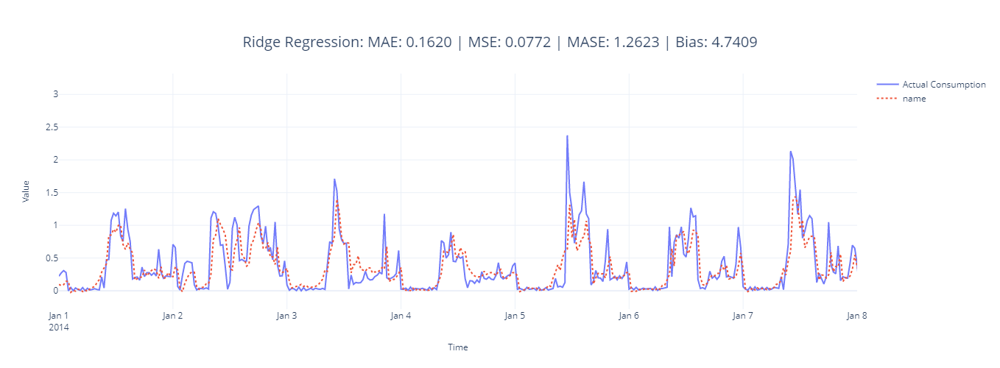

In [27]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=['name'])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [28]:
feat_df.head(10)

,feature,importance
5,energy_consumption_lag_1,0.146194
44,energy_consumption_48_seasonal_rolling_3_mean,0.060641
37,energy_consumption_rolling_3_mean,0.056304
26,energy_consumption_rolling_48_mean,0.055947
52,energy_consumption_336_seasonal_rolling_3_mean,0.055158
55,energy_consumption_rolling_3_std,-0.034981
43,energy_consumption_ewma__span_48,-0.034495
8,energy_consumption_lag_2,-0.021270
12,energy_consumption_rolling_48_std,-0.020228
6,energy_consumption_48_seasonal_rolling_3_std,-0.019226


### Lasso Regression (L2)

In [29]:
name = "Lasso Regression"
model = LassoCV()
with LogTime() as timer:
    y_pred, metrics, feat_df = eval_model(model, train_features, train_target, test_features, test_target, name=name, normalize=True, fill_missing=True)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Time Elapsed: 1 second


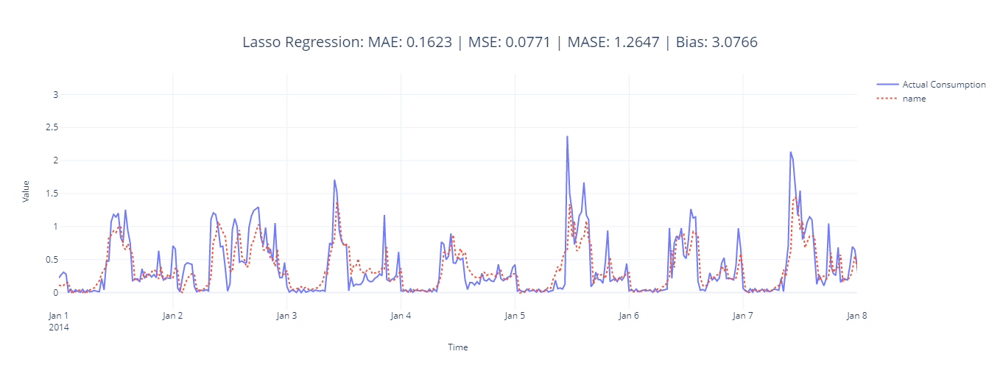

In [30]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=['name'])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [31]:
feat_df.head(10)

,feature,importance
5,energy_consumption_lag_1,0.164823
44,energy_consumption_48_seasonal_rolling_3_mean,0.060336
52,energy_consumption_336_seasonal_rolling_3_mean,0.053503
26,energy_consumption_rolling_48_mean,0.032019
55,energy_consumption_rolling_3_std,-0.031112
45,energy_consumption_lag_3,0.026722
51,timestamp_Hour_cos_1,-0.018717
6,energy_consumption_48_seasonal_rolling_3_std,-0.017184
43,energy_consumption_ewma__span_48,-0.015892
20,timestamp_Hour_sin_2,-0.012891


## Decision Tree

In [32]:
from sklearn.tree import DecisionTreeRegressor

In [33]:
name = "Decision Tree"
model = DecisionTreeRegressor(max_depth = 10)
with LogTime() as timer:
    y_pred, metrics, feat_df = eval_model(model, train_features, train_target, test_features, test_target, name=name, normalize=True, fill_missing=True)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

Time Elapsed: 1 second


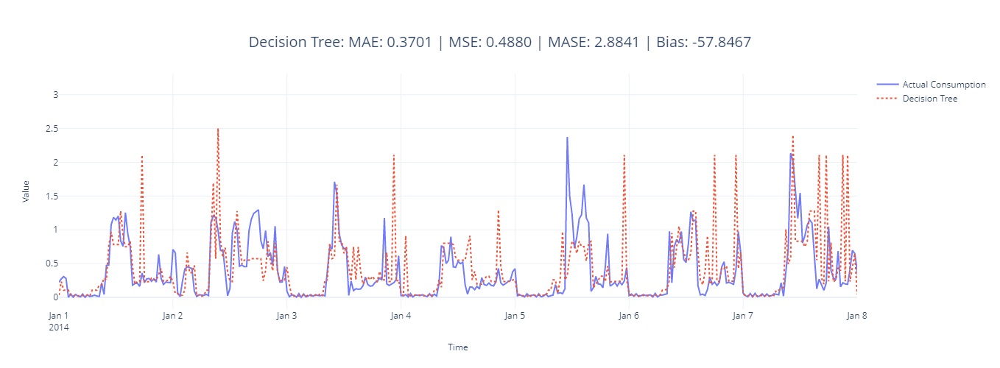

In [34]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=[name])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [35]:
feat_df.head(10)

,feature,importance
5,energy_consumption_lag_1,0.650358
44,energy_consumption_48_seasonal_rolling_3_mean,0.088522
52,energy_consumption_336_seasonal_rolling_3_mean,0.030349
21,timestamp_Elapsed,0.012730
46,energy_consumption_ewma__span_336,0.012404
26,energy_consumption_rolling_48_mean,0.011134
10,energy_consumption_lag_4,0.010957
51,timestamp_Hour_cos_1,0.010466
19,timestamp_Hour_sin_1,0.010046
8,energy_consumption_lag_2,0.009018


In [42]:
from sklearn.ensemble import RandomForestRegressor

In [43]:
name = "Random Forest"
model = RandomForestRegressor()
with LogTime() as timer:
    y_pred, metrics = eval_model(model, train_features, train_target, test_features, test_target, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

C:\Users\MANUJO~1\AppData\Local\Temp/ipykernel_7476/3622833128.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Time Elapsed: 1 minute and 51 seconds


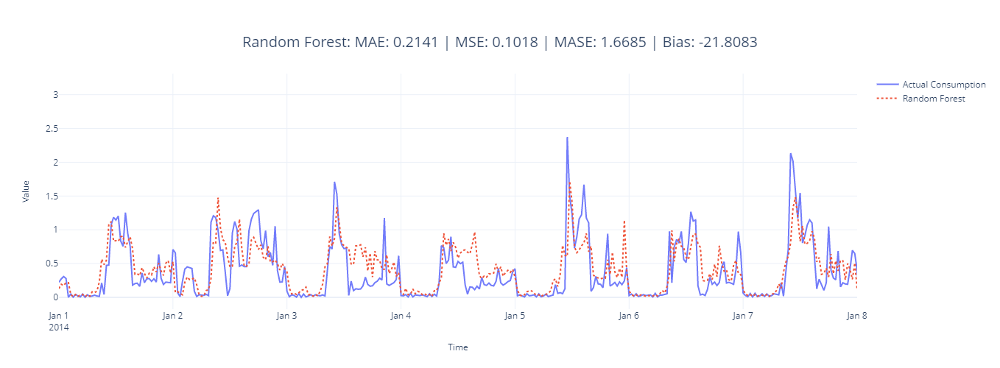

In [44]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=[name])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [45]:
from lightgbm import LGBMRegressor

In [46]:
name = "LightGBM"
model = LGBMRegressor()
with LogTime() as timer:
    y_pred, metrics = eval_model(model, train_features, train_target, test_features, test_target, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


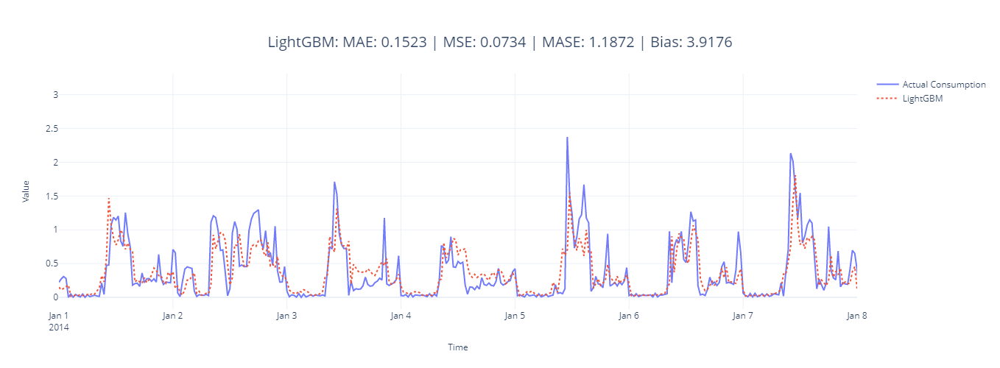

In [47]:
fig = plot_forecast(pred_df, forecast_columns=[name], forecast_display_names=[name])
fig = format_plot(fig, title=f"{name}: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

In [50]:
ft_df = pd.DataFrame({"features":model.feature_name_,"coeff":model.feature_importances_}).sort_values("coeff", ascending=False)

In [51]:
ft_df.head(20)

,features,coeff
8,energy_consumption_lag_1,221
26,energy_consumption_48_seasonal_rolling_3_mean,153
28,energy_consumption_336_seasonal_rolling_3_mean,139
9,energy_consumption_lag_2,128
19,energy_consumption_rolling_3_std,108
10,energy_consumption_lag_3,93
14,energy_consumption_lag_50,86
29,energy_consumption_336_seasonal_rolling_3_std,85
11,energy_consumption_lag_4,85
13,energy_consumption_lag_49,82


array([ 38,  60,  60,  42,  64,  43,  44,  56, 221, 128,  93,  85,  73,
        82,  86,  66,  70,  75,  64, 108,  50,  43,  74,  58,  74,  67,
       153,  76, 139,  85,  46,  54,  54,  76,  19,   8,   8,   9,  16,
        22,   3,   4,   1,   8,  52,  21,  17,  20,  33,  47,  14,  20,
         6,  45,  20,   0,   0,   0,   0,   0,   0,   0,   0,   0])

## Moving Average Forecast

In [27]:
from src.forecasting.baselines import NaiveMovingAverage

In [28]:
name = "Moving Average Forecast"
naive_model = NaiveMovingAverage(window=48)
with LogTime() as timer:
    y_pred, metrics = eval_model(naive_model, ts_train, ts_test, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "moving_average_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


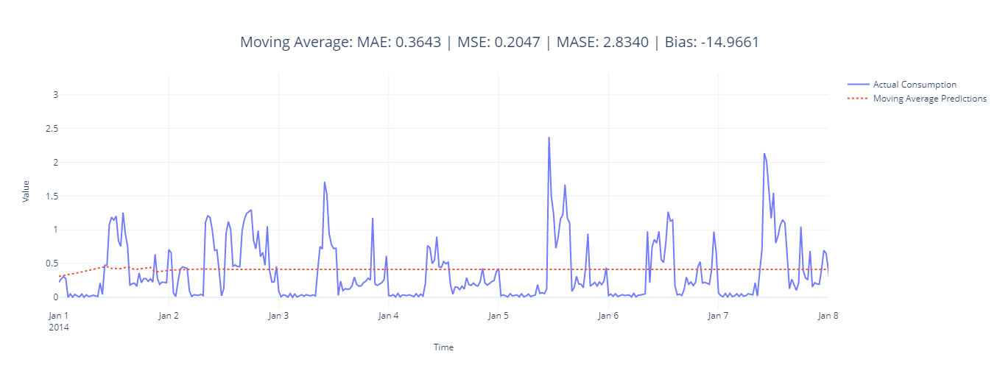

In [29]:
fig = plot_forecast(pred_df, forecast_columns=["moving_average_predictions"], forecast_display_names=['Moving Average Predictions'])
fig = format_plot(fig, title=f"Moving Average: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

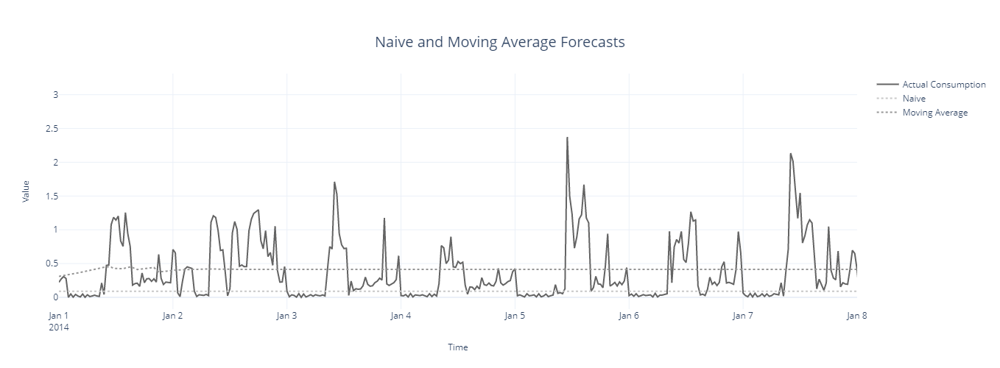

In [30]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "naive_predictions",
                        "moving_average_predictions"
                    ], 
                    forecast_display_names=[
                        "Naive",
                        'Moving Average'
                    ])
fig = format_plot(fig, title=f"Naive and Moving Average Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/naive_ma.png")
fig.show()

## Seasonal Naive Forecast

In [31]:
name = "Seasonal Naive Forecast"
naive_model = NaiveSeasonal(K=48*7)
with LogTime() as timer:
    y_pred, metrics = eval_model(naive_model, ts_train, ts_test, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "snaive_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


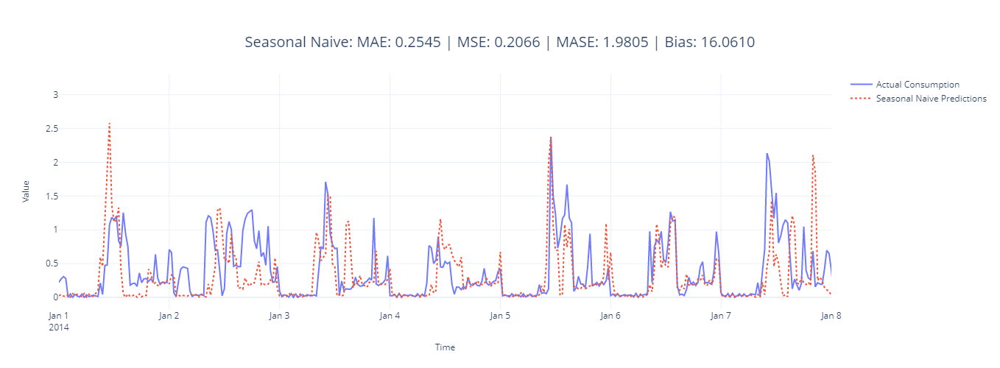

In [32]:
fig = plot_forecast(pred_df, forecast_columns=["snaive_predictions"], forecast_display_names=['Seasonal Naive Predictions'])
fig = format_plot(fig, title=f"Seasonal Naive: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

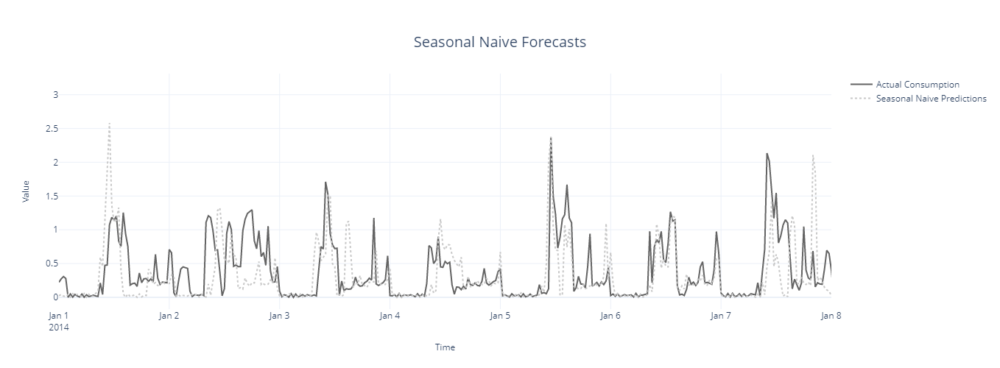

In [34]:
fig = plot_forecast(pred_df, forecast_columns=["snaive_predictions"], forecast_display_names=['Seasonal Naive Predictions'])
fig = format_plot(fig, title=f"Seasonal Naive Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/snaive.png")
fig.show()

## Exponential Smoothing Forecast

In [11]:
from darts.utils.utils import ModelMode, SeasonalityMode

In [36]:
name = "Exponential Smoothing"
# Suppress FutureWarning
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    ets_model = ExponentialSmoothing(trend=ModelMode.ADDITIVE, damped=True, seasonal=SeasonalityMode.ADDITIVE, seasonal_periods=48*7, random_state=42)
    with LogTime() as timer:
        y_pred, metrics = eval_model(ets_model, ts_train, ts_test, name=name)
    metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "ets_predictions")
pred_df = pred_df.join(y_pred)

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Time Elapsed: 26 seconds


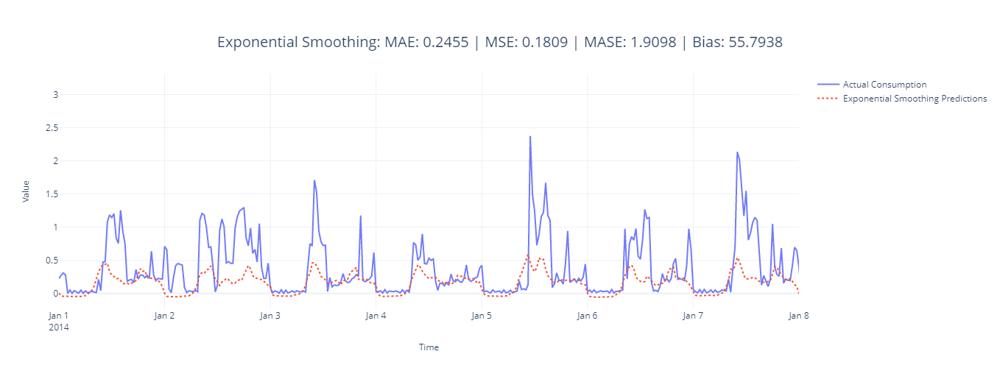

In [37]:
fig = plot_forecast(pred_df, forecast_columns=["ets_predictions"], forecast_display_names=['Exponential Smoothing Predictions'])
fig = format_plot(fig, title=f"Exponential Smoothing: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

## ARIMA

In [38]:
name = "ARIMA"
#Not using AutoARIMA because it just takes too much time for long time series
# arima_model = AutoARIMA(max_p=5, max_q=3, m=48, seasonal=False)
arima_model = ARIMA(p=2, d=1, q=1, seasonal_order=(1, 1, 1, 48))
# Taking only latest 8000 points for training (Time constraints)
# Reduce 8000 if it is taking too much time or consuming all the memory
with LogTime() as timer:
    y_pred, metrics = eval_model(arima_model, ts_train[-8000:], ts_test,  name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "arima_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 6 minutes and 3 seconds


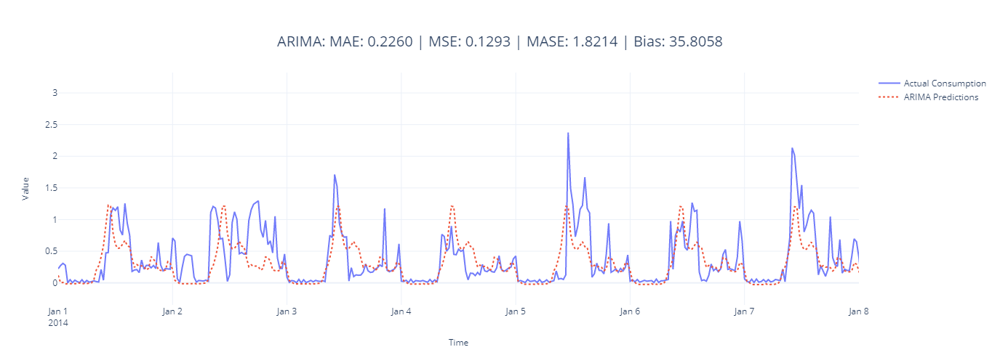

In [39]:
fig = plot_forecast(pred_df, forecast_columns=["arima_predictions"], forecast_display_names=['ARIMA Predictions'])
fig = format_plot(fig, title=f"ARIMA: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

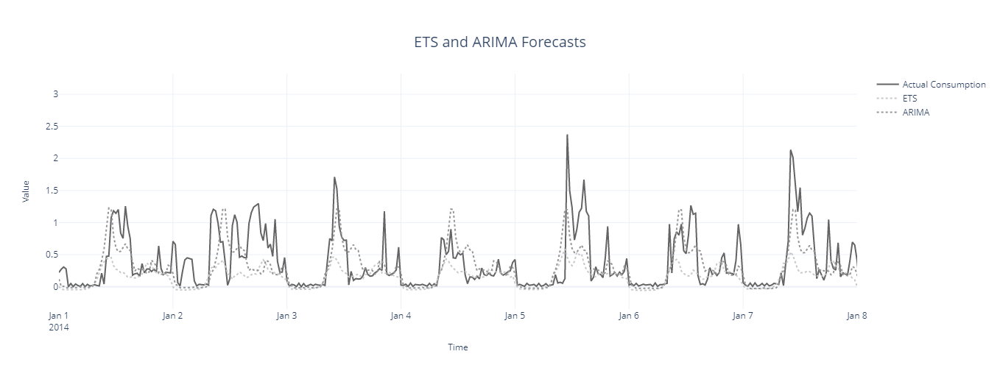

In [40]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "ets_predictions",
                        "arima_predictions"
                    ], 
                    forecast_display_names=[
                        "ETS",
                        'ARIMA'
                    ])
fig = format_plot(fig, title=f"ETS and ARIMA Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/ets_arima.png")
fig.show()

## Theta

In [41]:
name = "Theta"
theta_model = Theta(theta=3, seasonality_period=48*7, season_mode=SeasonalityMode.ADDITIVE)
with LogTime() as timer:
    y_pred, metrics = eval_model(theta_model, ts_train, ts_test, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "theta_predictions")
pred_df = pred_df.join(y_pred)

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



Time Elapsed: 1 second


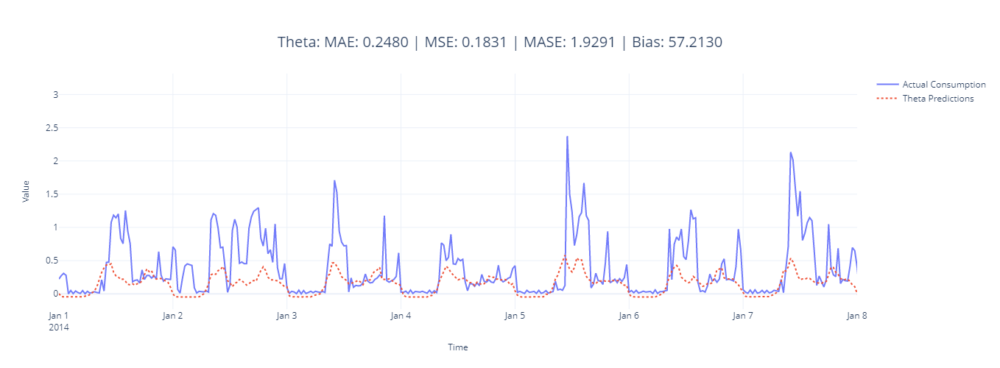

In [42]:
fig = plot_forecast(pred_df, forecast_columns=["theta_predictions"], forecast_display_names=['Theta Predictions'])
fig = format_plot(fig, title=f"Theta: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

## FFT

In [43]:
name = "FFT"
fft_model = FFT(nr_freqs_to_keep=35, trend="poly", trend_poly_degree=2)
with LogTime() as timer:
    y_pred, metrics = eval_model(fft_model, ts_train, ts_test, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "fft_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


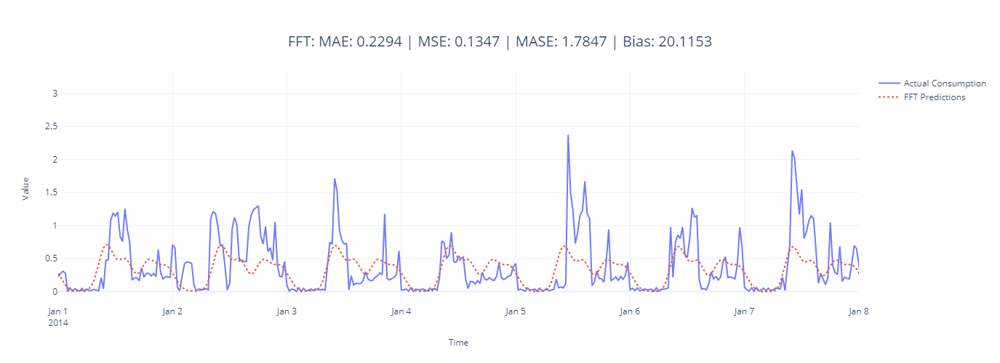

In [44]:
fig = plot_forecast(pred_df, forecast_columns=["fft_predictions"], forecast_display_names=['FFT Predictions'])
fig = format_plot(fig, title=f"FFT: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

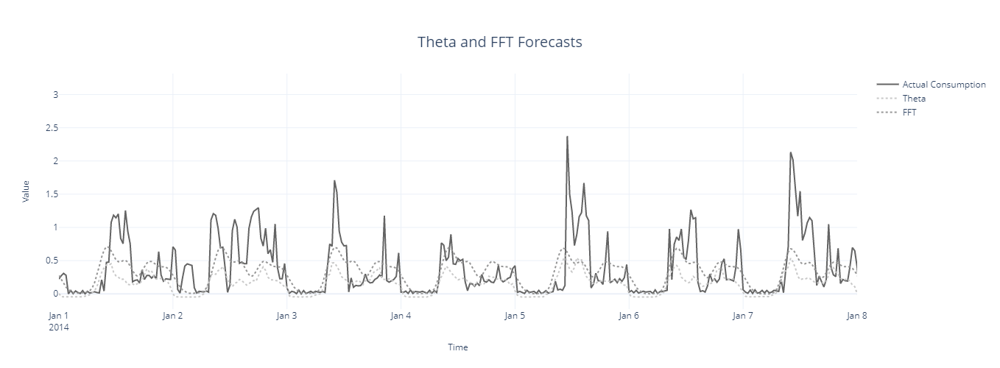

In [45]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "theta_predictions",
                        "fft_predictions"
                    ], 
                    forecast_display_names=[
                        "Theta",
                        'FFT'
                    ])
fig = format_plot(fig, title=f"Theta and FFT Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/theta_fft.png")
fig.show()

In [52]:
pd.DataFrame(metric_record).style.format({"MAE": "{:.3f}", 
                          "MSE": "{:.3f}", 
                          "MASE": "{:.3f}", 
                          "Forecast Bias": "{:.2f}%"}).highlight_min(color='lightgreen')

,Algorithm,MAE,MSE,MASE,Forecast Bias,Time Elapsed
0,Linear Regression,0.162,0.078,1.261,7.22%,0.190490
1,Ridge Regression,0.163,0.079,1.270,5.37%,1.515484
2,Lasso Regression,0.162,0.077,1.260,4.81%,3.008400
3,KNN,0.298,0.235,2.323,50.31%,2.166663
4,Decision Tree,0.406,0.522,3.163,-52.49%,1.937839
5,Random Forest,0.214,0.102,1.668,-21.81%,111.236693
6,LightGBM,0.152,0.073,1.187,3.92%,0.658205


Although ARIMA gives us the best metrics, it takes too long to run, even with a sampled timeseries.
We can see that Theta or FFT metrics are lower and doesn't take much time to run. So let's run Theta and FFT for all the consumers in blocks 0-7.

## Running Baseline Forecast for all consumers

In [9]:
lcl_ids = sorted(train_df.LCLid.unique())

### Theta Forecast

In [15]:
name = "Theta"
theta_preds = []
theta_metrics = []
for lcl_id in tqdm(lcl_ids):
    theta_model = Theta(theta=3, seasonality_period=48*7, season_mode=SeasonalityMode.ADDITIVE)
    tr = TimeSeries.from_series(train_df.loc[train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(theta_model, tr, ts, name=name)
    y_pred = format_y_pred(y_pred, "theta_predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    metrics["LCLid"] = lcl_id
    y_pred['energy_consumption'] = ts.data_array().to_series().values
    theta_preds.append(y_pred)
    theta_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [16]:
theta_pred_df = pd.concat(theta_preds)
theta_pred_df.head()

,theta_predictions,LCLid,energy_consumption
time,,,
2014-01-01 00:00:00,0.398836,MAC000002,0.496
2014-01-01 00:30:00,0.380464,MAC000002,0.427
2014-01-01 01:00:00,0.369484,MAC000002,0.469
2014-01-01 01:30:00,0.328537,MAC000002,0.362
2014-01-01 02:00:00,0.306195,MAC000002,0.452


In [17]:
theta_metric_df = pd.DataFrame(theta_metrics)
theta_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.195943,0.072140,1.819537,-21.151962,MAC000002
1,Theta,0.077784,0.013287,1.381620,-25.762586,MAC000005
2,Theta,0.127048,0.034506,1.911120,79.829550,MAC000017
3,Theta,0.133276,0.065462,1.207968,28.043983,MAC000030
4,Theta,0.310328,0.165492,1.656169,-3.726268,MAC000040


In [18]:
actual_series = TimeSeries.from_values(theta_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(theta_pred_df.theta_predictions.values)

In [19]:
overall_metrics_theta = {
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": theta_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_theta

{'MAE': 0.23328316392941528,
 'MSE': 0.16204442988671064,
 'meanMASE': 2.0918540100800063,
 'Forecast Bias': 15.222420149264238}

### FFT

In [20]:
name = "FFT"
fft_preds = []
fft_metrics = []
for lcl_id in tqdm(lcl_ids):
    fft_model = FFT(nr_freqs_to_keep=35, trend="poly", trend_poly_degree=2)
    tr = TimeSeries.from_series(train_df.loc[train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(fft_model, tr, ts, name=name)
    y_pred = format_y_pred(y_pred, "fft_predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    metrics["LCLid"] = lcl_id
    y_pred['energy_consumption'] = ts.data_array().to_series().values
    fft_preds.append(y_pred)
    fft_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

In [21]:
fft_pred_df = pd.concat(fft_preds)
fft_pred_df.head()

,fft_predictions,LCLid,energy_consumption
time,,,
2014-01-01 00:00:00,0.255057,MAC000002,0.496
2014-01-01 00:30:00,0.234834,MAC000002,0.427
2014-01-01 01:00:00,0.207254,MAC000002,0.469
2014-01-01 01:30:00,0.175136,MAC000002,0.362
2014-01-01 02:00:00,0.144155,MAC000002,0.452


In [22]:
fft_metric_df = pd.DataFrame(fft_metrics)
fft_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,FFT,0.161086,0.071382,1.495855,19.789891,MAC000002
1,FFT,0.060454,0.014239,1.073792,19.206939,MAC000005
2,FFT,0.081863,0.018645,1.231428,-3.537346,MAC000017
3,FFT,0.193511,0.074556,1.753911,-31.119541,MAC000030
4,FFT,0.382740,0.192267,2.042619,-22.836922,MAC000040


In [23]:
actual_series = TimeSeries.from_values(fft_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(fft_pred_df.fft_predictions.values)

In [24]:
overall_metrics_fft = {
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": fft_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_fft

{'MAE': 0.18104947693567097,
 'MSE': 0.1018420256835819,
 'meanMASE': 1.7945487852308037,
 'Forecast Bias': 11.453644515147369}

## Evaluation of Baseline Forecast

In [25]:
p_df = pd.DataFrame([overall_metrics_fft, overall_metrics_theta], index=["FFT","Theta"])

p_df.style.format({"MAE": "{:.3f}", 
                          "MSE": "{:.3f}", 
                          "meanMASE": "{:.3f}", 
                          "Forecast Bias": "{:.2f}%"}).highlight_min(color='lightgreen')

,MAE,MSE,meanMASE,Forecast Bias
FFT,0.181,0.102,1.795,11.45%
Theta,0.233,0.162,2.092,15.22%


In [26]:
baseline_pred_df = theta_pred_df.reset_index().merge(fft_pred_df.reset_index().drop(columns='energy_consumption'), on=['time','LCLid'], how='outer')

In [27]:
baseline_metrics_df = pd.concat([theta_metric_df, fft_metric_df])
baseline_metrics_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.195943,0.072140,1.819537,-21.151962,MAC000002
1,Theta,0.077784,0.013287,1.381620,-25.762586,MAC000005
2,Theta,0.127048,0.034506,1.911120,79.829550,MAC000017
3,Theta,0.133276,0.065462,1.207968,28.043983,MAC000030
4,Theta,0.310328,0.165492,1.656169,-3.726268,MAC000040


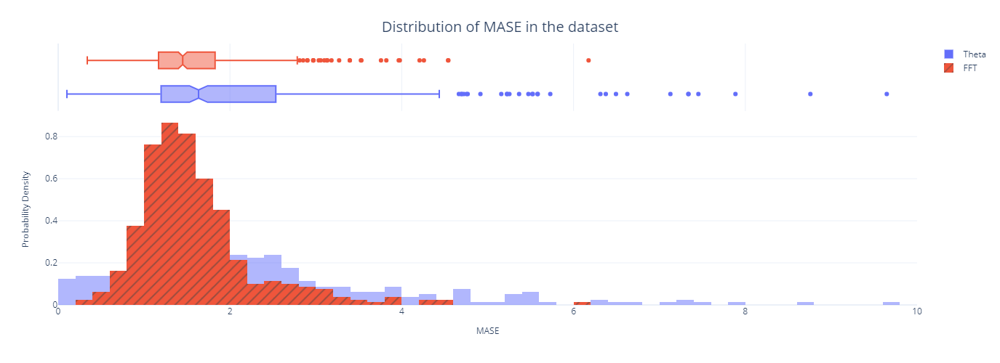

In [32]:
fig = px.histogram(baseline_metrics_df, 
                   x="MASE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MASE", ylabel="Probability Density", title="Distribution of MASE in the dataset")
fig.update_layout(xaxis_range=[0,10])
fig.write_image("imgs/chapter_4/mase_dist.png")
fig.show()

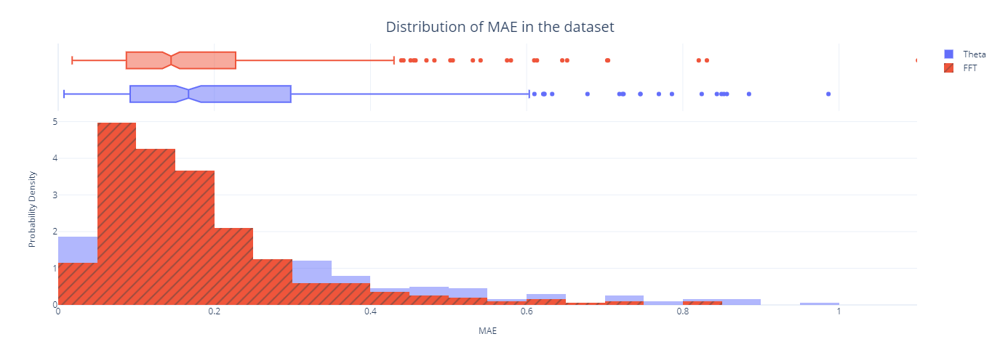

In [37]:
fig = px.histogram(baseline_metrics_df, 
                   x="MAE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=100, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MAE", ylabel="Probability Density", title="Distribution of MAE in the dataset")
fig.write_image("imgs/chapter_4/mae_dist.png")
fig.update_layout(xaxis_range=[0,1.1])
fig.show()

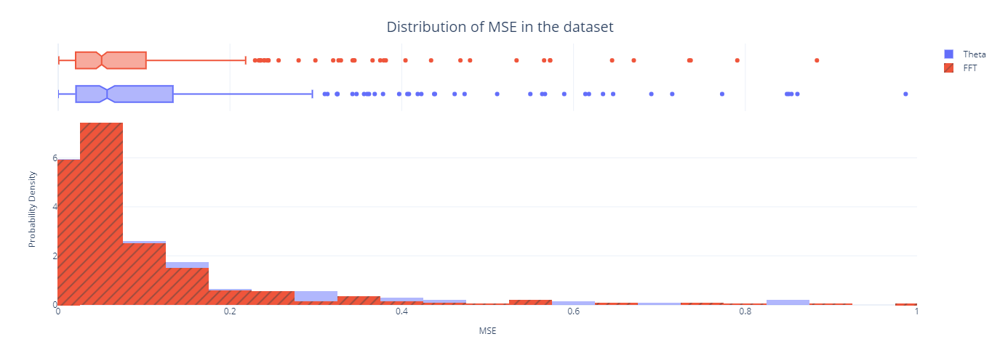

In [43]:
fig = px.histogram(baseline_metrics_df, 
                   x="MSE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MSE", ylabel="Probability Density", title="Distribution of MSE in the dataset")
fig.update_layout(xaxis_range=[0,1])
fig.write_image("imgs/chapter_4/mse_dist.png")
fig.show()

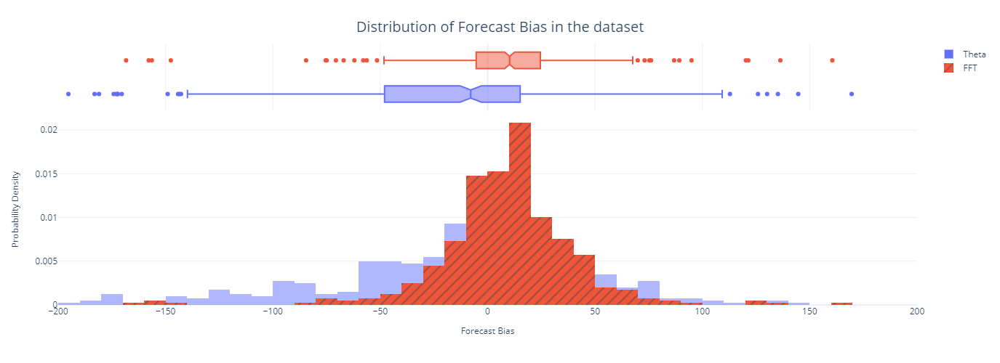

In [47]:
fig = px.histogram(baseline_metrics_df, 
                   x="Forecast Bias", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=250,
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="Forecast Bias", ylabel="Probability Density", title="Distribution of Forecast Bias in the dataset")
fig.update_layout(xaxis_range=[-200,200])
fig.write_image("imgs/chapter_4/bias_dist.png")
fig.show()

## Saving the Baseline Forecasts and Metrics

In [48]:
os.makedirs("data/london_smart_meters/output", exist_ok=True)
output = Path("data/london_smart_meters/output")

In [49]:
baseline_pred_df.to_pickle(output/"baseline_prediction_df.pkl")
baseline_metrics_df.to_pickle(output/"baseline_metrics_df.pkl")
p_df.to_pickle(output/"baseline_aggregate_metrics.pkl")